In [1]:
import ann_visualizer
import copy
import datetime
from IPython.display import display, Image
import json
import logging
import matplotlib.pyplot as plt
import numpy
import os
import pandas
import pdb
import pickle
import plotly
import pyarrow.parquet as pq
import random
import requests
import six
import slack
import tensorflow as tf
from tensorflow.keras.layers import LSTM, Dense, Bidirectional, Input, Dropout, BatchNormalization
import time

import CS230

plotly.offline.init_notebook_mode(connected=True)
#tf.enable_eager_execution()

# explore models

In [2]:
MODEL_NAME = 'model-explore'
MODEL_DIR = os.path.join('models', MODEL_NAME)

logger = CS230.common.get_logger()

# load and format data

In [3]:
FILE_PATHS = []

for dir_path, dir_names, file_names in os.walk(CS230.data.DATA_DIR):
    if dir_path.startswith('.'):
        continue
    
    for file_name in file_names:
        if file_name.endswith('.parquet'):
            file_path = os.path.join(dir_path, file_name)
            FILE_PATHS.append(file_path)
    
    if FILE_PATHS:
        break  # exit after loading files from 1 directory

FILE_PATHS.sort()
FILE_PATHS

['/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_01_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_01_02_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_02_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_03_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_03_02_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_03_03_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_04_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140222_01_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140222

In [4]:
COLS_X = {
    'x1': ['axCG', 'ayCG', 'azCG', 'brake', 'chassisAccelFL', 'chassisAccelFR', 'chassisAccelRL', 'chassisAccelRR', 
          'clutch', 'handwheelAngle', 'deflectionFL', 'deflectionFR',
          'horizontalSpeed', 'pitchAngle', 'pitchRate', 'rollAngle', 'rollRate', 'throttle', 'vxCG', 'vyCG', 'vzCG', 
          'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR', 'yawAngle', 'yawRate'],
    
    'x2': ['brake', 'clutch', 'handwheelAngle', 'throttle',
           'horizontalSpeed', 'pitchAngle', 'pitchRate', 'rollAngle', 'rollRate',
           'vxCG', 'vyCG', 'vzCG', 'yawAngle', 'yawRate'],
    
    'x3': ['brake', 'clutch', 'handwheelAngle', 'throttle',
           'pitchAngle', 'pitchRate', 'rollAngle', 'rollRate', 'yawAngle', 'yawRate',
           'vxCG', 'vyCG', 'vzCG', 'axCG', 'ayCG', 'azCG',
           'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR'],
    
    'all': CS230.data.COLUMNS_ALL,
}

COLS_Y = {
    'y1': ['axCG', 'ayCG', 'azCG', 'chassisAccelFL', 'chassisAccelFR', 'chassisAccelRL', 'chassisAccelRR',
          'horizontalSpeed', 'pitchAngle', 'pitchRate', 'rollAngle', 'rollRate', 'vxCG', 'vyCG', 'vzCG',
          'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR', 'yawAngle', 'yawRate'],
    
    'y2': ['pitchAngle', 'rollAngle', 'vxCG', 'vyCG', 'vzCG',
          'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR', 'yawAngle'],
    
    'y3': ['pitchAngle', 'pitchRate', 'rollAngle', 'rollRate', 'yawAngle', 'yawRate',
           'vxCG', 'vyCG', 'vzCG', 'axCG', 'ayCG', 'azCG',
           'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR'],
    
    'y4': ['pitchAngle', 'rollAngle', 'yawAngle',
           'vxCG', 'vyCG', 'vzCG',
           'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR'],
    
    #'y5': ['rollAngle', 'yawAngle', 'vxCG', 'vyCG', 'vzCG'],
    'y5': ['yawAngle', 'vxCG'],
}

In [5]:
def get_df(file_path, cols_x, cols_y):
    cols_all = copy.deepcopy(cols_x)
    cols_all.extend(cols_y)
    cols_all = list(set(cols_all))  # reduce to unique
    
    df = CS230.data.load(file_path)[cols_all]
    df = CS230.data.stride_rows(df, stride=10)
    df.dropna(axis=0, inplace=True)
    
    df_x = copy.deepcopy(df)[cols_x]
    df_x = df_x.iloc[:-1].reset_index(drop=True)
    
    df_y = copy.deepcopy(df)[cols_y]
    df_y = df_y.iloc[1:].reset_index(drop=True)
    
    return df_x, df_y

# get data

In [6]:
def get_cols_y(cols_y):
    if isinstance(cols_y, list):
        if cols_y[0] in COLS_Y.keys():
            cols_y = COLS_Y[cols_y[0]]
        else:
            cols_y = cols_y
    else:
        if cols_y in COLS_Y.keys():
            cols_y = COLS_Y[cols_y]
        else:
            cols_y = [cols_y]
    return(cols_y)

In [7]:
def get_data(file_path, cols_x, cols_y, sequence_length):
    DATA = {
        'df': {
            'x': pandas.DataFrame(columns=COLS_X[cols_x]),
            'y': pandas.DataFrame(columns=cols_y)
        }
    }

    df_x, df_y = get_df(file_path, cols_x=COLS_X[cols_x], cols_y=cols_y)

    print(len(df_x.shape))
    print(len(df_y.shape))

    DATA['df']['x'] = pandas.concat([DATA['df']['x'], df_x], ignore_index=True, sort=False)

    DATA['df']['y'] = pandas.concat([DATA['df']['y'], df_y], ignore_index=True, sort=False)

    DATA['generator'] = tf.keras.preprocessing.sequence.TimeseriesGenerator(
                                    DATA['df']['x'].values,
                                    DATA['df']['y'].values,
                                    length=sequence_length, sampling_rate=1  #, shuffle=True
    )
    
    return DATA

# explore models

In [8]:
SESS_DIR = 'models/model-7/20190605233635'
#SESS_DIR = 'models/model-8/20190607010106'
#SESS_DIR = 'models/model-8/20190607164735'
#SESS_DIR = 'models/model-7/20190607222343'
#SESS_DIR = 'models/model-7/20190608071746'
#SESS_DIR = 'models/model-8/20190609015128'
file_path = os.path.join(SESS_DIR, 'params.json')
with open(file_path, 'r') as f:
    params = json.load(f)
print(params)

{'sequence_length': 160, 'cols_x': 'x3', 'cols_y': 'y4', 'learning_rate': 0.005, 'learning_rate_decay': 1e-05, 'batch_norm': False, 'dropout': 0.1, 'lstm_units': 160, 'num_data_files': 4}


In [9]:
cols_x = params['cols_x']
cols_y = get_cols_y(params['cols_y'])
sequence_length = params['sequence_length']
learning_rate = params['learning_rate']
learning_rate_decay = params['learning_rate_decay']
batch_norm = params['batch_norm']
dropout = params['dropout']
lstm_units = params['lstm_units']
num_data_files = params['num_data_files']

In [10]:
FILE_PATHS

['/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_01_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_01_02_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_02_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_03_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_03_02_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_03_03_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140221_04_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140222_01_01_03_250lm.parquet',
 '/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140222

In [11]:
PREDICT_FILE_PATH = FILE_PATHS[-2]

In [12]:
print(PREDICT_FILE_PATH)
print(cols_x)
print(cols_y)
print(sequence_length)

/home/dave/code/github/davidcasterton/CS230_project/data/2014_Targa_Sixty-Six/20140222_01_01_03_250lm.parquet
x3
['pitchAngle', 'rollAngle', 'yawAngle', 'vxCG', 'vyCG', 'vzCG', 'wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR']
160


In [13]:
# load data
DATA = get_data(PREDICT_FILE_PATH, cols_x, cols_y, sequence_length)
m = DATA['df']['x'].shape[0]
n_x = DATA['df']['x'].shape[1]
n_y = DATA['df']['y'].shape[1]

2
2


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 160, 160)          115840    
_________________________________________________________________
lstm_1 (LSTM)                (None, 160)               205440    
_________________________________________________________________
dense (Dense)                (None, 10)                1610      
Total params: 322,890
Trainable params: 322,890
Non-trainable params: 0
_________________________________________________________________


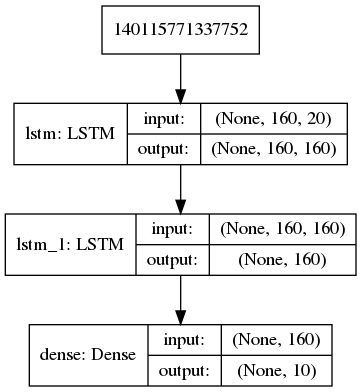

Instructions for updating:
Use tf.cast instead.


In [14]:
# build model
model = tf.keras.Sequential()

if batch_norm:
    model.add(BatchNormalization(input_shape=(sequence_length, n_x)))

model.add(LSTM(lstm_units, return_sequences=True, input_shape=(sequence_length, n_x),
               dropout=dropout, recurrent_dropout=dropout))

model.add(LSTM(lstm_units, return_sequences=False, dropout=dropout, recurrent_dropout=dropout))
#model.add(tf.keras.layers.Dense(n_x, activation='sigmoid'))

model.add(tf.keras.layers.Dense(n_y, activation='linear'))

# summarize model
model.summary()

# visualize model
file_path = os.path.join(SESS_DIR, 'architecture.png')
tf.keras.utils.plot_model(model, file_path, show_shapes=True, show_layer_names=True,)
display(Image(filename=file_path))

# set optimizer
optimizer = tf.keras.optimizers.Adam(lr=learning_rate, decay=learning_rate_decay)
#optimizer = tf.keras.optimizers.SGD(lr=0.03, decay=1e-6, momentum=0.9, nesterov=True)

# compile model
model.compile(
    optimizer=optimizer, 
    loss='mean_squared_error', 
    metrics=['mean_absolute_error']
)

# load pre-trained model
for file_name in os.listdir(SESS_DIR):
    if file_name.startswith('model_end'):
        file_path = os.path.join(SESS_DIR, file_name)
        logging.info('loading %s', file_path)
        model.load_weights(file_path)

In [15]:
predictions = model.predict(DATA['generator'])

In [16]:
df_predictions = pandas.DataFrame(predictions, columns=cols_y)

In [17]:
df_error = DATA['df']['y'][cols_y] - df_predictions[cols_y]

In [18]:
sets = [('dev x', DATA['df']['x']), ('dev y', DATA['df']['y']), ('predictions', df_predictions), ('error', df_error)]

#indexes = [random.randint(1, len(DATA[data_name]['df']['x'])) for x in range(3)]
indexes = [x + 1000 for x in range(3)]

for name, df in sets:
    print(name)
    display(df.iloc[indexes,:])
for name, df in sets:
    print('%s max' % name)
    display(pandas.DataFrame(df.max()).T)
for name, df in sets:
    print('%s min' % name)
    display(pandas.DataFrame(df.min()).T)

dev x


,brake,clutch,handwheelAngle,throttle,pitchAngle,pitchRate,rollAngle,rollRate,yawAngle,yawRate,vxCG,vyCG,vzCG,axCG,ayCG,azCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
1000,0.0,0.0,26.4,0.3,-0.9,0.00,0.0,-0.11,1.9,0.15,0.0,0.0,0.0,0.29,-0.05,9.68,10.01,9.52,8.73,8.24
1001,0.0,0.0,26.4,0.2,-0.9,-0.04,0.0,-0.93,1.9,0.22,0.0,0.0,0.0,-0.05,-0.02,10.62,10.10,9.61,7.85,8.44
1002,0.0,0.0,26.4,0.0,-0.9,0.09,0.0,0.31,1.9,0.31,0.0,0.0,0.0,-0.07,0.03,9.26,10.01,9.91,9.32,9.32


dev y


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
1000,-0.9,0.0,1.9,0.0,0.0,0.0,10.10,9.61,7.85,8.44
1001,-0.9,0.0,1.9,0.0,0.0,0.0,10.01,9.91,9.32,9.32
1002,-0.9,0.0,1.9,0.0,0.0,0.0,10.01,10.01,8.14,8.73


predictions


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
1000,-0.923357,0.529936,-0.105602,1.496459,0.248630,-0.066857,9.632141,9.628302,8.918515,8.598684
1001,-0.930875,0.502274,0.091601,1.489829,0.258487,-0.067776,9.624470,9.583549,8.921844,8.537066
1002,-0.926905,0.523652,-0.085564,1.602560,0.249599,-0.069327,9.631406,9.614060,8.914363,8.581472


error


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
1000,0.023357,-0.529936,2.005602,-1.496459,-0.248630,0.066857,0.467859,-0.018302,-1.068515,-0.158684
1001,0.030875,-0.502274,1.808399,-1.489829,-0.258487,0.067776,0.385530,0.326451,0.398156,0.782934
1002,0.026905,-0.523652,1.985564,-1.602560,-0.249599,0.069327,0.378594,0.395940,-0.774363,0.148528


dev x max


,brake,clutch,handwheelAngle,throttle,pitchAngle,pitchRate,rollAngle,rollRate,yawAngle,yawRate,vxCG,vyCG,vzCG,axCG,ayCG,azCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,100.0,100.0,355.9,100.0,2.3,10.68,3.62,38.94,179.98,34.15,61.23,2.02,2.2,7.04,16.58,33.19,51.11,64.35,50.62,92.12


dev y max


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,2.3,3.62,179.98,61.23,2.02,2.2,51.11,64.35,50.62,92.12


predictions max


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,1.722707,3.443853,186.634537,51.336971,0.675313,0.544152,13.747026,11.931561,13.777395,12.199736


error max


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,2.395228,4.126974,338.672119,20.179074,2.196645,2.112536,39.586969,54.054081,39.56096,80.46376


dev x min


,brake,clutch,handwheelAngle,throttle,pitchAngle,pitchRate,rollAngle,rollRate,yawAngle,yawRate,vxCG,vyCG,vzCG,axCG,ayCG,azCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,0.0,0.0,-230.4,0.0,-2.95,-7.72,-2.46,-30.09,-180.0,-32.56,-0.49,-2.02,-1.19,-11.02,-13.31,-15.04,-29.23,-37.18,-47.48,-40.71


dev y min


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,-2.95,-2.46,-180.0,-0.49,-2.02,-1.19,-29.23,-37.18,-47.48,-40.71


predictions min


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,-1.607741,-1.729303,-178.192978,-1.013419,-0.847291,-0.978055,7.183166,7.540776,6.279991,6.597422


error min


,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
0,-3.181712,-3.622483,-354.583755,-15.055076,-1.955637,-1.30717,-40.756037,-47.693721,-58.492181,-50.512157


In [19]:
def get_traces_from_df(df, df_predict, start=0, stop=None, step=100):
    traces = []
    for column in df.columns:
        y = df[column].values[start:stop:step]
        x = list(range(len(y)))
        name = column
        trace = plotly.graph_objs.Scatter(
            x=x,
            y=y,
            name=name
        )
        traces.append(trace)
    return traces

In [20]:
df_orig = CS230.data.load(PREDICT_FILE_PATH)

In [21]:
_ = [print(x) for x in COLS_X[cols_x]]

brake
clutch
handwheelAngle
throttle
pitchAngle
pitchRate
rollAngle
rollRate
yawAngle
yawRate
vxCG
vyCG
vzCG
axCG
ayCG
azCG
wheelAccelFL
wheelAccelFR
wheelAccelRL
wheelAccelRR


# plot inputs

images/results/human input.png


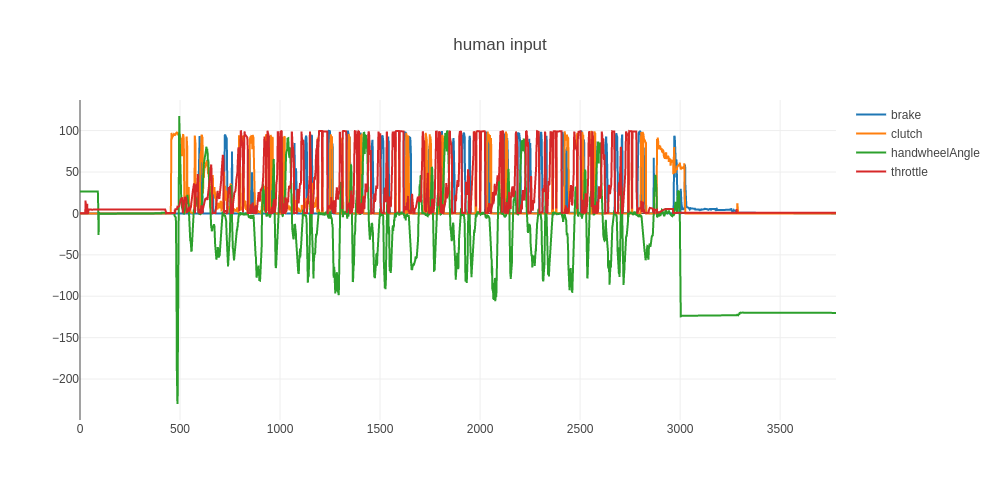

images/results/orientation.png


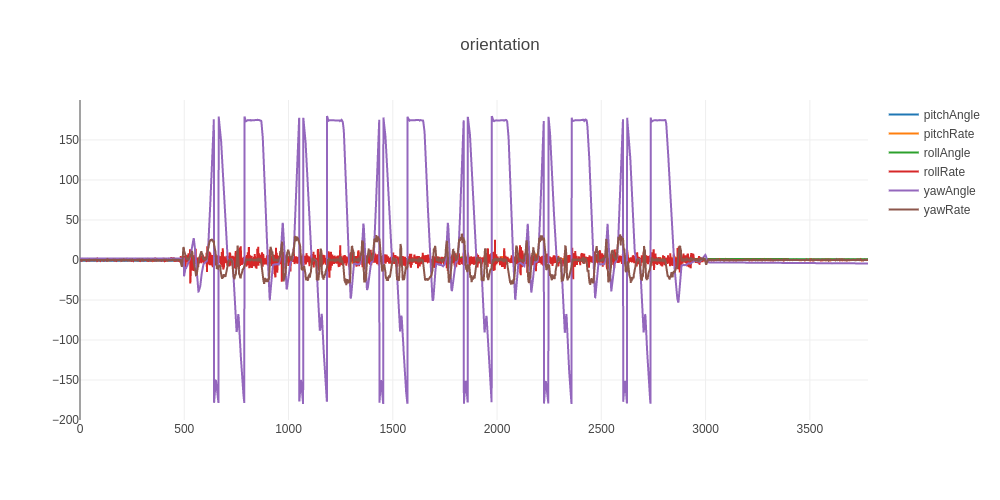

images/results/velocity.png


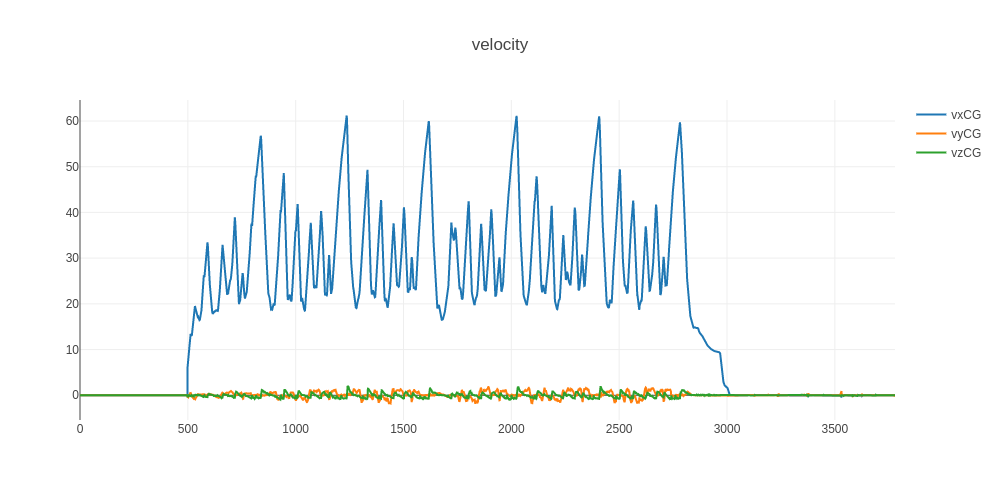

images/results/acceleration.png


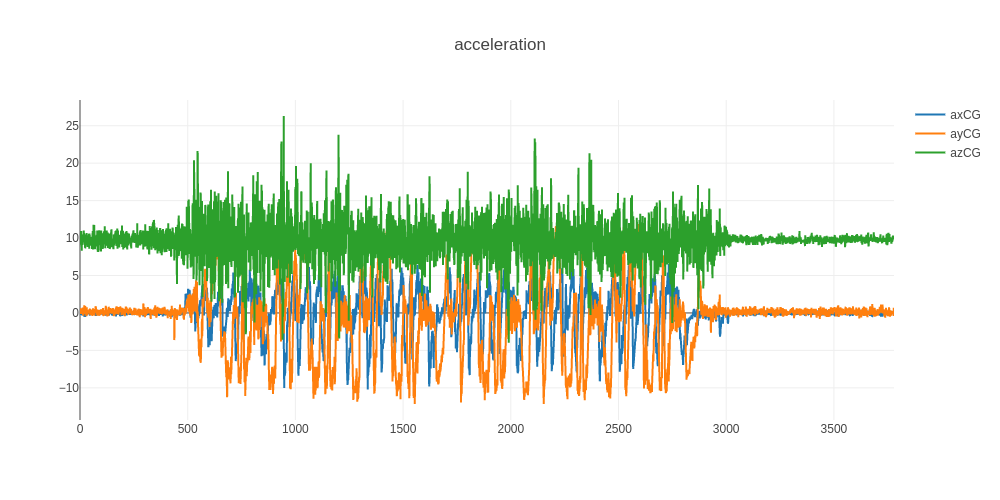

images/results/wheel accel.png


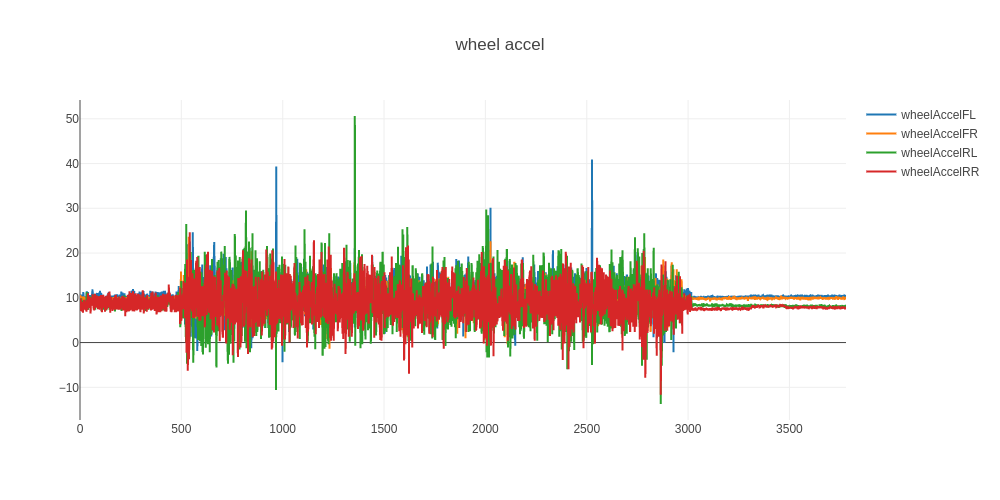

In [22]:
start = 0
stop = None
step = 250

col_groups = {
    'human input': ['brake', 'clutch', 'handwheelAngle', 'throttle'],
    'orientation': ['pitchAngle', 'pitchRate', 'rollAngle', 'rollRate', 'yawAngle', 'yawRate'],
    'velocity': ['vxCG', 'vyCG', 'vzCG'],
    'acceleration': ['axCG', 'ayCG', 'azCG'],
    'wheel accel': ['wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR']
}

for group_name, col_group in six.iteritems(col_groups):
    traces = []
    
    for col in col_group:
        if col in ['time', 'gpsTime']:
            continue

        y = df_orig[col].values[start:stop:step]
        x = list(range(len(y)))
        trace = plotly.graph_objs.Scatter(
            x=x,
            y=y,
            name=col
        )
        traces.append(trace)
    
    layout = plotly.graph_objs.Layout(
        title='%s' % (group_name),
        yaxis=dict(side='left'),
        yaxis2=dict(overlaying='y', side='right')
    )
    fig = plotly.graph_objs.Figure(data=traces, layout=layout)

    # save plot to file
    file_path = os.path.join('images', 'results', group_name + '.png')
    plotly.io.write_image(fig, file_path, width=1000, height=500)

    # display plot from file
    print(file_path)
    display(Image(filename=file_path))

    # plot inline
    #display(plotly.offline.iplot(fig))

# plot predictions

In [23]:
df_orig.iloc[sequence_length*10:][col][0:None:100].reset_index(drop=True).tail()

9429    7.95
9430    7.75
9431    7.65
9432    7.95
9433    7.85
Name: wheelAccelRR, dtype: float64

In [24]:
df_predictions[0:None:10].reset_index(drop=True).tail()

,pitchAngle,rollAngle,yawAngle,vxCG,vyCG,vzCG,wheelAccelFL,wheelAccelFR,wheelAccelRL,wheelAccelRR
9429,0.010521,1.429598,-6.266184,0.735884,0.088402,0.046438,10.296244,10.006803,8.098885,8.025778
9430,0.013200,1.441079,-6.115010,0.749300,0.089308,0.045764,10.299229,10.013406,8.108335,8.026249
9431,0.006685,1.422124,-6.564901,0.708568,0.083577,0.048082,10.286538,9.999625,8.073489,8.035104
9432,0.002420,1.397555,-6.589415,0.681166,0.089365,0.046756,10.296251,9.992908,8.089769,8.021008
9433,0.005764,1.414575,-6.533771,0.703482,0.086332,0.047390,10.290998,9.998204,8.082361,8.028643


In [34]:
# plot predictions
file_path = os.path.join(SESS_DIR, 'predictions.jpeg')
df = df_predictions

start = 10000
stop = 10200
step = 1

#cols = COLS_Y[cols_y]
#cols = ['vxCG', 'vyCG']
#cols = ['pitchAngle', 'rollAngle', 'yawAngle']
#cols = ['wheelAccelFL', 'wheelAccelFR', 'wheelAccelRL', 'wheelAccelRR']
for col in cols_y:
    
    df_error = df_orig.iloc[sequence_length*10:][col][0:None:100].reset_index(drop=True) - df_predictions[col][0:None:10].reset_index(drop=True)
    
    data = [
        #(col, df_orig.iloc[sequence_length*10:][col], 0, None, 100),
        #('predict_' + col, df_predictions[col], 0, None, 10),
        #('error_' + col, df_error, 0, None, 1),
        
        (col, df_orig.iloc[sequence_length*10:][col], 0, None, 100),
        ('predict_' + col, df_predictions[col], 0, None, 10),
        ('error_' + col, df_error, 0, None, 1),
        
        #('handwheelAngle', df_orig.iloc[sequence_length*10:]['handwheelAngle'] * -1, 0, None, 100)
    ]
    
    mse = float(sum(numpy.sqrt(df_error.values**2)) / len(df_error))
    print('%s mean %s max %s min %s range %s mse %s percent %s' % (col, df_orig[col].mean(), max(df_orig[col]), min(df_orig[col]), max(df_orig[col]) - min(df_orig[col]), mse,
                                                       100.0 * mse / (max(df_orig[col]) - min(df_orig[col])) ))
    
    traces = []
    for name, df, start, stop, step in data:
        y = df.values[start:stop:step]
        x = list(range(len(y)))
        
        yaxis = 'y'
        #if max(abs(y)) > 2:
        #    yaxis = 'y2'
        #    name = name + ' (right axis)'
        
        trace = plotly.graph_objs.Scatter(
            x=x,
            y=y,
            name=name,
            yaxis = yaxis
        )
        traces.append(trace)
    
    #traces = []
    #traces.extend(get_traces_from_df(df_orig.iloc[sequence_length*10:][cols], start=0, stop=None, step=100))
    #traces.extend(get_traces_from_df(df_predictions[cols], prefix='predict_', start=0, stop=None, step=10))

    layout = plotly.graph_objs.Layout(
        title='%s' % (col),
        yaxis=dict(side='left'),
        yaxis2=dict(overlaying='y', side='right'),
        legend=dict(orientation="h"),
        width=900,
        height=350,
    )
    fig = plotly.graph_objs.Figure(data=traces, layout=layout)

    # save plot to file
    #file_path = os.path.join('images', 'results', 'out_' + col + '.png')
    #plotly.io.write_image(fig, file_path, width=1000, height=500)

    # display plot from file
    #print(file_path)
    #display(Image(filename=file_path))

    # plot inline
    display(plotly.offline.iplot(fig))

pitchAngle mean -0.11306052910052909 max 2.3 min -2.95 range 5.25 mse 0.3550182818929551 percent 6.76225298843724


None

rollAngle mean 0.3233922751322751 max 3.62 min -2.46 range 6.08 mse 0.586102944998347 percent 9.63985106905176


None

yawAngle mean 20.727704973544984 max 179.98 min -180.0 range 359.98 mse 2.9698992493674603 percent 0.8250178480380744


None

vxCG mean 19.689918941798958 max 61.23 min -0.49 range 61.72 mse 1.8806082561699793 percent 3.0469997669636735


None

vyCG mean 0.0877506878306878 max 2.02 min -2.02 range 4.04 mse 0.2793262614686813 percent 6.91401637298716


None

vzCG mean -0.028844338624338623 max 2.2 min -1.19 range 3.39 mse 0.1875555104417192 percent 5.532610927484342


None

wheelAccelFL mean 10.712104666666667 max 53.27 min -30.61 range 83.88 mse 1.5321493798927355 percent 1.8265967809880015


None

wheelAccelFR mean 9.90541433862434 max 77.3 min -62.29 range 139.59 mse 1.2932079594758048 percent 0.926433096551189


None

wheelAccelRL mean 9.280649936507936 max 60.33 min -51.31 range 111.64 mse 2.5389106112292716 percent 2.2741943848345323


None

wheelAccelRR mean 8.768088941798943 max 109.19 min -73.58 range 182.76999999999998 mse 2.1642873926124495 percent 1.1841589936053234


None

In [26]:
df_predictions['vxCG'].values

array([1.5370959 , 1.6447592 , 1.3647838 , ..., 0.74983513, 0.6680833 ,
       0.7716886 ], dtype=float32)

In [27]:
col = 'wheelAccelFL'
df_error = df_orig.iloc[sequence_length*10:][col][0:None:100].reset_index(drop=True) - df_predictions[col][0:None:10].reset_index(drop=True)

In [28]:
sum(numpy.sqrt(df_error.values**2)) / len(df_error)

1.5321493798927355